In [1]:
# Importing all necessary libraries
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
from glob import glob                            # is used to return all file paths that matches specific pattern like here png

In [2]:
tissue_train = [cv.imread(i) for i in glob("/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images/*.png")]  # reading the tissue training images
mask_train = [cv.imread(i) for i in glob("/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask/*.png")]      # reading the masks training images
tissue_test = [cv.imread(i) for i in glob("/content/drive/MyDrive/MoNuSeg-Test-Data/Tissue-Images/*.png")]       # reading the tissue test images
mask_test = [cv.imread(i) for i in glob("/content/drive/MyDrive/MoNuSeg-Test-Data/Binary-Mask/*.png")]           # reading the masks test images

In [5]:
# Stacking the examples
tissue_train_example = np.hstack((tissue_train[0],tissue_train[1],tissue_train[2]))  # Examples of tissue training images
binary_train_example = np.hstack((mask_train[0],mask_train[1],mask_train[2]))        # Examples of masks training images
tissue_test_example = np.hstack((tissue_test[0],tissue_test[1],tissue_test[2]))      # Examples of tissue test images
binary_test_example = np.hstack((mask_test[0],mask_test[1],mask_test[2]))            # Examples of masks test images

Examples of Training and Test set

Training Tissue Images


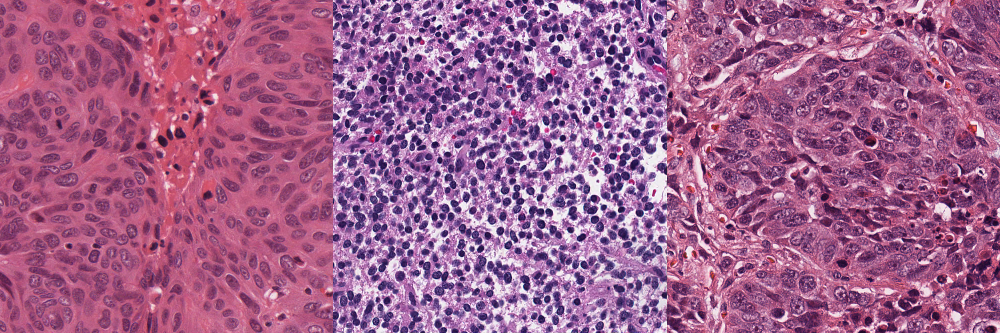

Training Binary Masks


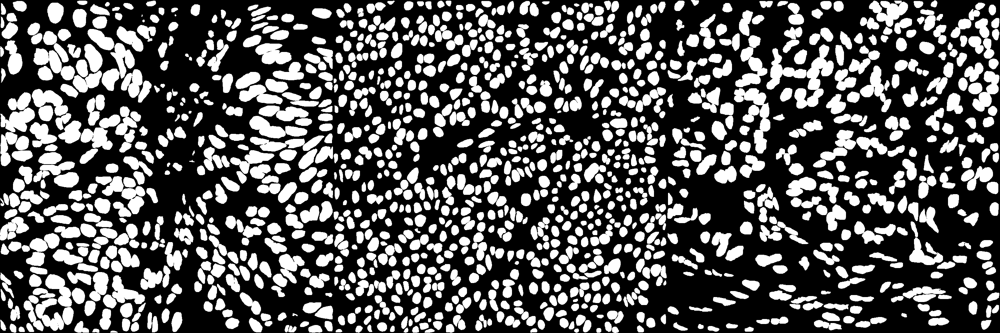

Test Tissue Images


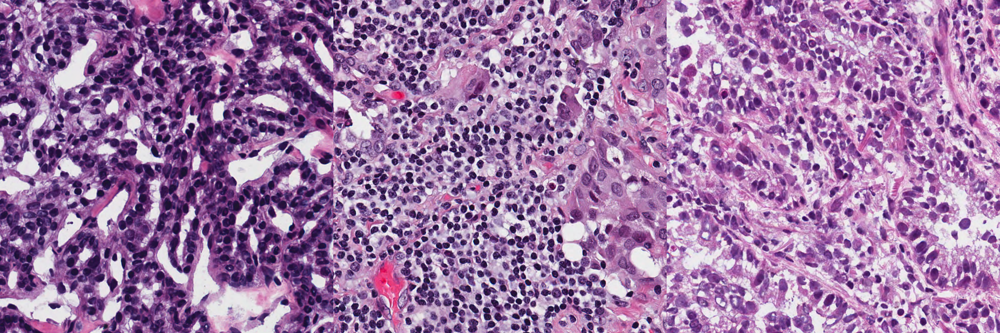

Test Binary Masks


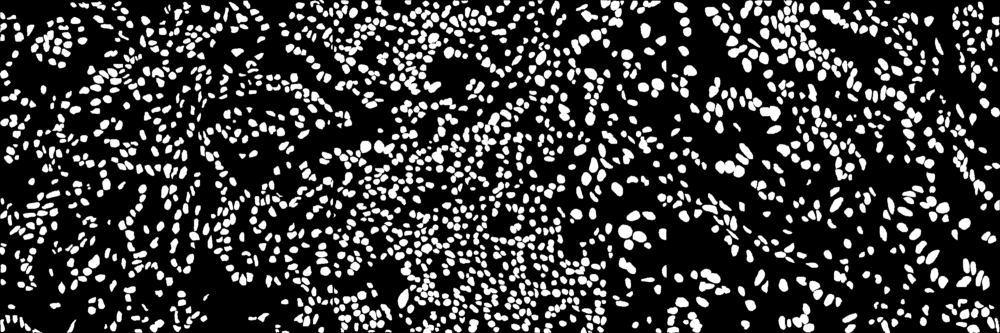

In [4]:
#Displaying the example images
print("Training Tissue Images")
cv2_imshow(tissue_train_example)              
print("Training Binary Masks")
cv2_imshow(binary_train_example)
print("Test Tissue Images")
cv2_imshow(tissue_test_example)
print("Test Binary Masks")
cv2_imshow(binary_test_example)

In [6]:
image_size = 512                                  # Image sizing
xtrain = []                                       # Training dataset
ytrain = []                                       # Training dataset targets
for i in range(len(tissue_train)):
    tissue_gray = cv.cvtColor(tissue_train[i], cv.COLOR_BGR2GRAY)     # Converting to gray scale
    mask_gray = cv.cvtColor(mask_train[i], cv.COLOR_BGR2GRAY)         # Converting to gray scale
    tissue_gray = tissue_gray/255                                     # Normalizing from 0 to 1
    mask_gray = mask_gray/255                                         # Normalizing from 0 to 1
    tissue_gray = cv.resize(tissue_gray, (image_size, image_size))    # Image resizing
    mask_gray = cv.resize(mask_gray, (image_size, image_size))        # Image resizing 
    xtrain.append(tissue_gray)                                        # Adding them into a list
    ytrain.append(mask_gray)                                          # Adding masks into a list

In [7]:
xtest = []
ytest = []
for i in range(len(tissue_test)):
    tissue_gray = cv.cvtColor(tissue_test[i], cv.COLOR_BGR2GRAY)     # Converting to gray scale
    mask_gray = cv.cvtColor(mask_test[i], cv.COLOR_BGR2GRAY)         # Converting to gray scale
    tissue_gray = tissue_gray/255                                     # Normalizing from 0 to 1
    mask_gray = mask_gray/255                                         # Normalizing from 0 to 1
    tissue_gray = cv.resize(tissue_gray, (image_size, image_size))    # Image resizing
    mask_gray = cv.resize(mask_gray, (image_size, image_size))        # Image resizing 
    xtest.append(tissue_gray)                                        # Adding them into a list
    ytest.append(mask_gray)                                          # Adding masks into a list

In [12]:
import tensorflow as tf
from tensorflow import keras
import keras.backend as K

In [8]:
# The dice loss function is taken from the following kaggle site https://www.kaggle.com/code/bigironsphere/loss-function-library-keras-pytorch/notebook
def DiceLoss(targets, inputs, smooth=1e-6):
  
    inputs = K.flatten(inputs)         #flatten label and prediction tensors
    targets = K.flatten(targets)
  
    intersection = K.sum(targets*inputs)
    dice = (2*intersection + smooth) / (K.sum(targets) + K.sum(inputs) + smooth)
    return 1 - dice                  # The loss is 1-dice

In [9]:
# This block of code and next is inspired from the video link shared by the sir: https://www.youtube.com/watch?v=M3EZS__Z_XE&ab_channel=IdiotDeveloper

def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):                                      # Convlove and downsample
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    p = keras.layers.MaxPool2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):                                 # Convlove and upsample
    us = keras.layers.UpSampling2D((2, 2))(x)
    concat = keras.layers.Concatenate()([us, skip])
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):                                     # Bottleneck layer
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

In [10]:
def UNet(image_shape):
    f = [64, 128, 256,512,1024]
    inputs = keras.layers.Input(image_shape)
    
    p0 = inputs
    c1, p1 = down_block(p0, f[0])                      # Unet model
    c2, p2 = down_block(p1, f[1])                      # Downsampling part
    c3, p3 = down_block(p2, f[2]) 
    c4, p4 = down_block(p3, f[3])
    
    bn = bottleneck(p4, f[4])                         # Bottleneck layer
    
    u1 = up_block(bn, c4, f[3])                       # Upsampling part
    u2 = up_block(u1, c3, f[2]) 
    u3 = up_block(u2, c2, f[1])
    u4 = up_block(u3, c1, f[0])
    
    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(u4)
    model = keras.models.Model(inputs, outputs)
    return model

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 512, 512, 64  640         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 512, 512, 64  36928       ['conv2d_19[0][0]']              
                                )                                                           

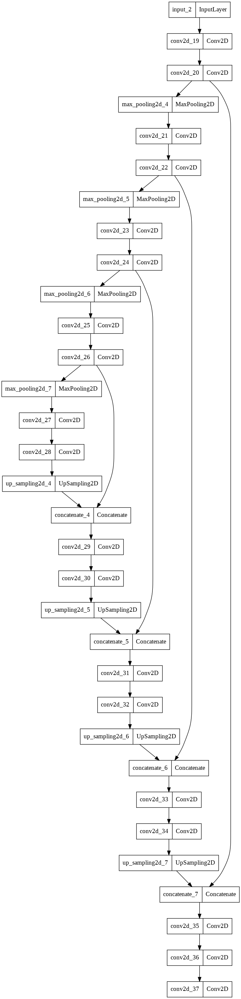

In [14]:
model = UNet((image_size, image_size, 1))
model.compile(optimizer="adam", loss=DiceLoss)              # Using diceloss and adam optimizer
model.summary()                                             # Summary of the model
keras.utils.plot_model(model, show_layer_names=True)        # Summary of the model in picture part

Training the Model

In [15]:
x1 = np.array(xtrain[:20])             # Splitting validation images
y1 = np.array(ytrain[:20])             # Splitting validation images
x2 = np.array(xtrain[20:])             # Splitting validation images
y2 = np.array(ytrain[20:])             # Splitting validation images
model.fit(x=x1,y=y1,batch_size=2,epochs=5,verbose=1,validation_data=(x2, y2))  # Fitting the model with 5 epochs

Epoch 1/5
10/10 [==============================] - 25s 640ms/step - loss: 0.5906 - val_loss: 0.6141
Epoch 2/5
10/10 [==============================] - 5s 542ms/step - loss: 0.5715 - val_loss: 0.6141
Epoch 3/5
10/10 [==============================] - 6s 589ms/step - loss: 0.5731 - val_loss: 0.6141
Epoch 4/5
10/10 [==============================] - 6s 591ms/step - loss: 0.5741 - val_loss: 0.6141
Epoch 5/5
10/10 [==============================] - 6s 591ms/step - loss: 0.5721 - val_loss: 0.6141
